In [21]:
import pandas as pd
from rdkit import Chem
import seaborn as sns
from tqdm import tqdm
import numpy as np

In [22]:
tqdm.pandas()

# NCATS CYP3A4
Dataset from https://pubchem.ncbi.nlm.nih.gov/bioassay/1671199

## Assay info

Cytochrome P450 (CYP) enzymes are membrane-bound hemeproteins that play a key role in metabolism of drugs and xenobiotics. Evaluation of the effect of chemicals on CYP isozymes is useful to minimize the adverse drug reactions and toxicities in drug development process. Tox21 chemicals were tested for their effect on CYP enzyme activities by using P450-Glo (TM) screening systems (Promega Corporation, Madison, WI). These systems provide a luminescent method containing proluciferin substrates and are converted to luciferin products by CYP isozymes. The luciferin products formed are detected with a luciferin detection reagent, and the amount of light produced is proportional to CYP activity. P450-Glo (TM) CYP1A2 screening system (Catalog. No. V9770) was used to detect the compounds that interfere in CYP1A2 activity. The positive control compound used for CYP1A2 assay is furafylline (Sigma-Aldrich, St. Louis, MO).

In [23]:
df = pd.read_csv("Tox21/AID_1671199_datatable_all_TOX21_1A2.csv")

/var/folders/4h/4_v2nd3n4dn85gnfv734rbbc0000gn/T/ipykernel_54119/354020116.py:1: DtypeWarning: Columns (0,9,10,11,12,14,15,16,17,18,19,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,50,51,52,53,55,56,57,58,59,60,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,90,91,92,93,95,96,97,98,99,100,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,26

In [24]:
list(df.columns)

['PUBCHEM_RESULT_TAG',
 'PUBCHEM_SID',
 'PUBCHEM_CID',
 'PUBCHEM_EXT_DATASOURCE_SMILES',
 'PUBCHEM_ACTIVITY_OUTCOME',
 'PUBCHEM_ACTIVITY_SCORE',
 'PUBCHEM_ACTIVITY_URL',
 'PUBCHEM_ASSAYDATA_COMMENT',
 'Phenotype-Replicate_1',
 'Potency-Replicate_1',
 'Efficacy-Replicate_1',
 'Analysis Comment-Replicate_1',
 'Activity_Score-Replicate_1',
 'Curve_Description-Replicate_1',
 'Fit_LogAC50-Replicate_1',
 'Fit_HillSlope-Replicate_1',
 'Fit_R2-Replicate_1',
 'Fit_InfiniteActivity-Replicate_1',
 'Fit_ZeroActivity-Replicate_1',
 'Fit_CurveClass-Replicate_1',
 'Excluded_Points-Replicate_1',
 'Max_Response-Replicate_1',
 'Activity at 0.0000075213 uM-Replicate_1',
 'Activity at 0.0000171744 uM-Replicate_1',
 'Activity at 0.0000689059 uM-Replicate_1',
 'Activity at 0.0001619730 uM-Replicate_1',
 'Activity at 0.0003751800 uM-Replicate_1',
 'Activity at 0.0007781017 uM-Replicate_1',
 'Activity at 0.00212 uM-Replicate_1',
 'Activity at 0.00657 uM-Replicate_1',
 'Activity at 0.017 uM-Replicate_1',
 'Act

In [25]:
df[0:5] # first 5 rows are metadata

,PUBCHEM_RESULT_TAG,PUBCHEM_SID,PUBCHEM_CID,PUBCHEM_EXT_DATASOURCE_SMILES,PUBCHEM_ACTIVITY_OUTCOME,PUBCHEM_ACTIVITY_SCORE,PUBCHEM_ACTIVITY_URL,PUBCHEM_ASSAYDATA_COMMENT,Phenotype-Replicate_1,Potency-Replicate_1,...,Activity at 23.64 uM-Replicate_51,Activity at 52.95 uM-Replicate_51,Activity at 115.2 uM-Replicate_51,Activity at 299.6 uM-Replicate_51,Activity at 1087.9 uM-Replicate_51,Activity at 2306.0 uM-Replicate_51,Activity at 5157.0 uM-Replicate_51,Activity at 11530.0 uM-Replicate_51,Activity at 25780.0 uM-Replicate_51,Activity at 57660.0 uM-Replicate_51
0,RESULT_TYPE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,STRING,FLOAT,...,STRING,STRING,STRING,STRING,STRING,STRING,STRING,STRING,STRING,STRING
1,RESULT_DESCR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Indicates type of activity observed: inhibitor...,Concentration at which compound exhibits half-...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,RESULT_UNIT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,MICROMOLAR,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,RESULT_IS_ACTIVE_CONCENTRATION,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TRUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,RESULT_ATTR_CONC_MICROMOL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
df = df.drop(labels=list(range(0, 5)), axis=0).reset_index(
    drop=True
)
df.head()

,PUBCHEM_RESULT_TAG,PUBCHEM_SID,PUBCHEM_CID,PUBCHEM_EXT_DATASOURCE_SMILES,PUBCHEM_ACTIVITY_OUTCOME,PUBCHEM_ACTIVITY_SCORE,PUBCHEM_ACTIVITY_URL,PUBCHEM_ASSAYDATA_COMMENT,Phenotype-Replicate_1,Potency-Replicate_1,...,Activity at 23.64 uM-Replicate_51,Activity at 52.95 uM-Replicate_51,Activity at 115.2 uM-Replicate_51,Activity at 299.6 uM-Replicate_51,Activity at 1087.9 uM-Replicate_51,Activity at 2306.0 uM-Replicate_51,Activity at 5157.0 uM-Replicate_51,Activity at 11530.0 uM-Replicate_51,Activity at 25780.0 uM-Replicate_51,Activity at 57660.0 uM-Replicate_51
0,1,144205501.0,17931.0,CN1C(=S)CN=C(C2=C1C=CC(=C2)Cl)C3=CC=CC=C3,Inconclusive,20.0,http://assay.nih.gov/htsws/rest/display/tox21-...,NaN,Inhibitor,24.5454,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,144206117.0,3045407.0,CO[C@H]1[C@@H](C[C@@H]2CN3CCC4=C([C@H]3C[C@@H]...,Inconclusive,10.0,http://assay.nih.gov/htsws/rest/display/tox21-...,NaN,Inhibitor,38.9018,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,144206325.0,14708.0,C[C@]12CC[C@H]3[C@H]([C@@H]1CC[C@]2(C)O)CC[C@@...,Inactive,0.0,http://assay.nih.gov/htsws/rest/display/tox21-...,NaN,Inactive,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,144206326.0,3085168.0,CC1=NC=C(C(=N1)N)CN(C=O)/C(=C(\CCO)/SS/C(=C(/C...,Inactive,0.0,http://assay.nih.gov/htsws/rest/display/tox21-...,NaN,Inactive,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,144206328.0,54158.0,CC1=CC(=C(C(=C1NC(=O)CN(CC(=O)O)CC(=O)O)C)Br)C,Inactive,0.0,http://assay.nih.gov/htsws/rest/display/tox21-...,NaN,Inactive,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<Axes: xlabel='PUBCHEM_ACTIVITY_SCORE', ylabel='Count'>

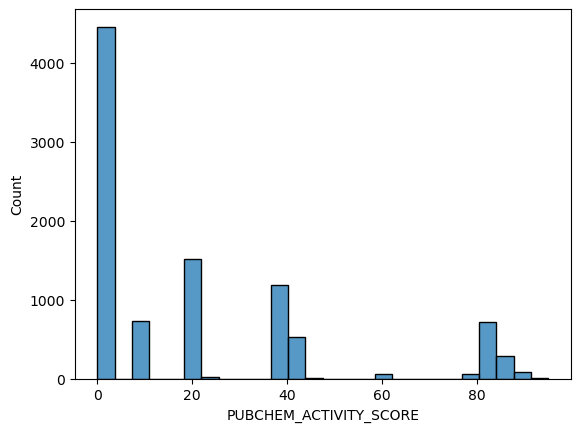

In [27]:
sns.histplot(data=df, x="PUBCHEM_ACTIVITY_SCORE")

<Axes: xlabel='PUBCHEM_ACTIVITY_OUTCOME', ylabel='Count'>

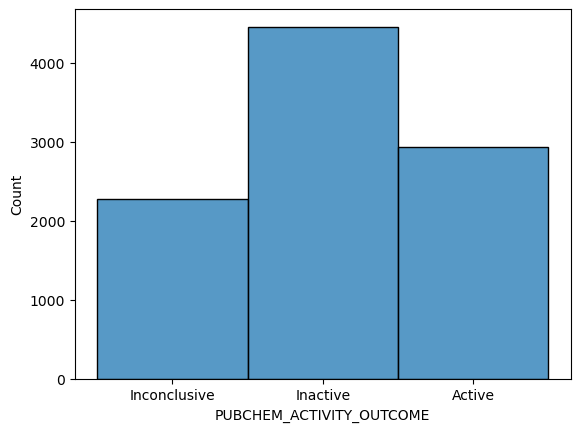

In [28]:
sns.histplot(data=df, x="PUBCHEM_ACTIVITY_OUTCOME")

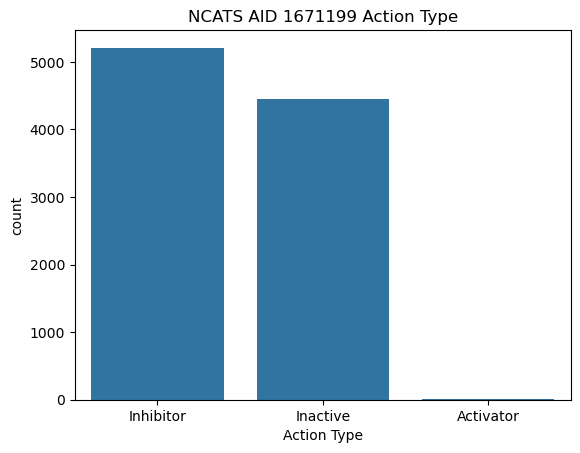

In [29]:
import matplotlib.pyplot as plt
plt.title("NCATS AID 1671199 Action Type")
sns.countplot(data=df, x="Phenotype-Replicate_1")
plt.xlabel("Action Type")
plt.savefig("NCATS_AID_1671199.png")

In [30]:
# clean up the main_dataset
activity_cols = ["PUBCHEM_ACTIVITY_OUTCOME", "PUBCHEM_ACTIVITY_SCORE"]
mol_col = "PUBCHEM_EXT_DATASOURCE_SMILES"
mol_id_cols = ["PUBCHEM_SID", "PUBCHEM_CID"]
len(df)

9667

In [31]:
df = df.dropna(subset="PUBCHEM_CID")
len(df)

9524

In [32]:
# standardisation of SMILES
from rdkit import Chem
from rdkit.Chem.MolStandardize import rdMolStandardize
from rdkit.rdBase import BlockLogs
import mols2grid
from utils.utils import standardize_smiles

In [33]:
with BlockLogs():
    df["CANONICAL_SMILES"] = df["PUBCHEM_EXT_DATASOURCE_SMILES"].progress_apply(lambda x: standardize_smiles(x))

100%|██████████| 9524/9524 [00:56<00:00, 169.04it/s]


In [34]:
from utils.utils import smi_to_inchikey
# compute inchikeys
with BlockLogs():
    df["INCHIKEY"] = df["CANONICAL_SMILES"].progress_apply(lambda x: smi_to_inchikey(x))

100%|██████████| 9524/9524 [00:01<00:00, 7030.70it/s]


In [35]:
df.INCHIKEY.isna().sum() # there are a few that couldn't be standardised

9

In [36]:
df.dropna(subset="INCHIKEY")

,PUBCHEM_RESULT_TAG,PUBCHEM_SID,PUBCHEM_CID,PUBCHEM_EXT_DATASOURCE_SMILES,PUBCHEM_ACTIVITY_OUTCOME,PUBCHEM_ACTIVITY_SCORE,PUBCHEM_ACTIVITY_URL,PUBCHEM_ASSAYDATA_COMMENT,Phenotype-Replicate_1,Potency-Replicate_1,...,Activity at 115.2 uM-Replicate_51,Activity at 299.6 uM-Replicate_51,Activity at 1087.9 uM-Replicate_51,Activity at 2306.0 uM-Replicate_51,Activity at 5157.0 uM-Replicate_51,Activity at 11530.0 uM-Replicate_51,Activity at 25780.0 uM-Replicate_51,Activity at 57660.0 uM-Replicate_51,CANONICAL_SMILES,INCHIKEY
0,1,144205501.0,17931.0,CN1C(=S)CN=C(C2=C1C=CC(=C2)Cl)C3=CC=CC=C3,Inconclusive,20.0,http://assay.nih.gov/htsws/rest/display/tox21-...,NaN,Inhibitor,24.5454,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CN1C(=S)CN=C(c2ccccc2)c2cc(Cl)ccc21,MWGWTOPCKLQYEU-UHFFFAOYSA-N
1,2,144206117.0,3045407.0,CO[C@H]1[C@@H](C[C@@H]2CN3CCC4=C([C@H]3C[C@@H]...,Inconclusive,10.0,http://assay.nih.gov/htsws/rest/display/tox21-...,NaN,Inhibitor,38.9018,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,COC(=O)C1[C@H]2C[C@@H]3c4[nH]c5cc(OC)ccc5c4CCN...,KFDDPVMIQMFHBI-VEFOKBAZSA-N
2,3,144206325.0,14708.0,C[C@]12CC[C@H]3[C@H]([C@@H]1CC[C@]2(C)O)CC[C@@...,Inactive,0.0,http://assay.nih.gov/htsws/rest/display/tox21-...,NaN,Inactive,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,C[C@]12Cc3nonc3C[C@@H]1CC[C@@H]1[C@@H]2CC[C@@]...,RGLLOUBXMOGLDQ-IVEVATEUSA-N
3,4,144206326.0,3085168.0,CC1=NC=C(C(=N1)N)CN(C=O)/C(=C(\CCO)/SS/C(=C(/C...,Inactive,0.0,http://assay.nih.gov/htsws/rest/display/tox21-...,NaN,Inactive,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,C/C(=C(\CCO)SS/C(CCO)=C(\C)N(C=O)Cc1cnc(C)nc1N...,GFEGEDUIIYDMOX-KBNZVFGVSA-N
4,5,144206328.0,54158.0,CC1=CC(=C(C(=C1NC(=O)CN(CC(=O)O)CC(=O)O)C)Br)C,Inactive,0.0,http://assay.nih.gov/htsws/rest/display/tox21-...,NaN,Inactive,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cc1cc(C)c(NC(=O)CN(CC(=O)O)CC(=O)O)c(C)c1Br,MHPZZZZLAQGTHT-UHFFFAOYSA-N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9661,9662,251919986.0,47364.0,C[As+](C)(C)CC(=O)[O-],Inactive,0.0,http://assay.nih.gov/htsws/rest/display/tox21-...,NaN,Inactive,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,C[As+](C)(C)CC(=O)[O-],SPTHHTGLGVZZRH-UHFFFAOYSA-N
9662,9663,251919987.0,23664984.0,CCC1=C(C(=CC=C1)CC)N(COC)C(=O)CS(=O)(=O)[O-].[...,Inactive,0.0,http://assay.nih.gov/htsws/rest/display/tox21-...,NaN,Inactive,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CCc1cccc(CC)c1N(COC)C(=O)CS(=O)(=O)O,UTCJUUGCHWHUNI-UHFFFAOYSA-N
9663,9664,251919988.0,2724429.0,CCCC(C(CO)O)O,Inactive,0.0,http://assay.nih.gov/htsws/rest/display/tox21-...,NaN,Inactive,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CCCC(O)C(O)CO,XYXCXCJKZRDVPU-UHFFFAOYSA-N
9664,9665,251919989.0,13059052.0,CC(C)(C1=CC(=C(C=C1)O)C2=CC=CC=C2)C3=CC(=C(C=C...,Active,40.0,http://assay.nih.gov/htsws/rest/display/tox21-...,NaN,Inhibitor,35.5742,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CC(C)(c1ccc(O)c(-c2ccccc2)c1)c1ccc(O)c(-c2cccc...,BKTRENAPTCBBFA-UHFFFAOYSA-N


In [37]:
keep_cols = ["CANONICAL_SMILES", "INCHIKEY", "PUBCHEM_ACTIVITY_OUTCOME", "PUBCHEM_CID"]

In [38]:
clean = df[keep_cols]
clean["dataset"] = "tox_adme_aid1671199"
clean["data_type"] = "assay"

/var/folders/4h/4_v2nd3n4dn85gnfv734rbbc0000gn/T/ipykernel_54119/3062718141.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean["dataset"] = "tox_adme_aid1671199"
/var/folders/4h/4_v2nd3n4dn85gnfv734rbbc0000gn/T/ipykernel_54119/3062718141.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean["data_type"] = "assay"


In [39]:
mols2grid.display(clean, smiles_col="CANONICAL_SMILES")

MolGridWidget()

In [40]:
clean.head()
clean["common_name"] = pd.NA
clean["action_type"] = "inhibitor"
clean.to_csv("./processed/tox21_adme_aid1671199.csv", index=False)

/var/folders/4h/4_v2nd3n4dn85gnfv734rbbc0000gn/T/ipykernel_54119/4138372736.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean["common_name"] = pd.NA
/var/folders/4h/4_v2nd3n4dn85gnfv734rbbc0000gn/T/ipykernel_54119/4138372736.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean["action_type"] = "inhibitor"
